# 导包

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from sklearn.preprocessing import StandardScaler , PowerTransformer , RobustScaler 
from sklearn.decomposition import PCA
from scipy.stats import chi2_contingency
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

In [2]:
plt.rcParams['font.sans-serif'] = ['Arial Unicode MS']  # 或者 'PingFang SC'
plt.rcParams['axes.unicode_minus'] = False

# 数据读取

In [3]:
data = pd.read_csv('train_data.csv')
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1700 entries, 0 to 1699
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Age                       1700 non-null   float64
 1   Attrition                 1700 non-null   int64  
 2   BusinessTravel            1700 non-null   float64
 3   DailyRate                 1700 non-null   float64
 4   Department                1700 non-null   float64
 5   DistanceFromHome          1700 non-null   float64
 6   Education                 1700 non-null   float64
 7   EducationField            1700 non-null   float64
 8   EmployeeCount             1700 non-null   float64
 9   EmployeeNumber            1700 non-null   float64
 10  EnvironmentSatisfaction   1700 non-null   float64
 11  Gender                    1700 non-null   float64
 12  HourlyRate                1700 non-null   float64
 13  JobInvolvement            1700 non-null   float64
 14  JobLevel

## 特征信息

<font size=5>基础信息列</font>

- Age

    - 员工年龄（数值型）

- Attrition

    - 是否离职（二分类变量）

    - 0 = 未离职，1 = 已离职（目标变量）

- BusinessTravel

    - 出差频率（分类变量，数值编码）

    - 常见编码：0=不出差，1=偶尔出差，2=频繁出差

<font size=5>薪酬与工作条件</font>

- DailyRate

    - 日薪或每日费用（数值型，需确认单位）

- HourlyRate

    - 时薪（数值型）

- MonthlyIncome

    - 月收入（数值型，关键经济指标）

- MonthlyRate

    - 月费率（可能指公司成本或员工薪资结构）

- PercentSalaryHike

    - 薪资涨幅百分比（数值型，如11表示11%）

<font size=5>岗位与部门信息</font>

- Department

    - 所属部门（分类变量，数值编码）

    - 常见编码：1=研发，2=销售，3=人力资源等（需结合数据字典）

- JobRole

    - 具体职位（分类变量，数值编码，如6可能代表“销售主管”）

- JobLevel

    - 职级（数值型，如2=中级）

- StandardHours

    - 标准工时（固定值80，冗余列，可忽略）

<font size=5>个人背景与满意度</font>

- Education

    - 教育水平（分类变量，数值编码）

    - 通常：1=高中，2=学士，3=硕士，4=博士等

- EducationField

    - 教育领域（分类变量，数值编码，如1=技术，3=人力资源等）

- Gender

    - 性别（二分类变量，0=女，1=男）

- MaritalStatus

    - 婚姻状况（分类变量，数值编码）

    - 常见：0=单身，1=已婚，2=离异

<font size=5>工作经历与稳定性</font>

- NumCompaniesWorked

    - 曾任职公司数量（数值型）

- TotalWorkingYears

    - 总工作年限（数值型）

- YearsAtCompany

    - 在当前公司工作年数（数值型）

- YearsInCurrentRole

    - 在当前职位工作年数（数值型）

- YearsSinceLastPromotion

    - 距离上次晋升的年数（数值型，关键离职风险指标）

- YearsWithCurrManager

    - 与当前直属上级共事年数（数值型）

<font size=5>满意度与绩效</font>

- EnvironmentSatisfaction

    - 工作环境满意度（分类变量，数值编码，1=低，4=高）

- JobSatisfaction

    - 工作满意度（同上）

- RelationshipSatisfaction

    - 同事关系满意度（同上）

- WorkLifeBalance

    - 工作生活平衡满意度（同上）

- PerformanceRating

    - 绩效评分（数值型，如3=中等）

<font size=5>其他辅助列</font>

- DistanceFromHome

    - 家庭到公司距离（数值型，单位可能是公里/英里）

- EmployeeNumber

    - 员工编号（唯一标识符，无分析意义）

- EmployeeCount

    - 员工计数列

    - 固定值1（冗余列，可忽略）

- Over18

    - 是否成年（固定值0，冗余列）

- OverTime

    - 是否加班（二分类变量，0=否，1=是）

- StockOptionLevel

    - 股票期权等级（数值型，0=无，1=低等）

- TrainingTimesLastYear

    - 去年参加培训次数（数值型）

In [4]:
# 去除固定数值的冗余列
data.drop(axis=1, labels=['Over18','EmployeeCount','EmployeeNumber','StandardHours'],inplace=True)

In [5]:
data.columns, len(data.columns)

(Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
        'DistanceFromHome', 'Education', 'EducationField',
        'EnvironmentSatisfaction', 'Gender', 'HourlyRate', 'JobInvolvement',
        'JobLevel', 'JobRole', 'JobSatisfaction', 'MaritalStatus',
        'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'OverTime',
        'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction',
        'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear',
        'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole',
        'YearsSinceLastPromotion', 'YearsWithCurrManager'],
       dtype='object'),
 31)

# EDA 

In [6]:
categorical_feature = ['Attrition','BusinessTravel','Department','JobRole','JobLevel','Education','EducationField','Gender','MaritalStatus',
                       'EnvironmentSatisfaction','JobSatisfaction','RelationshipSatisfaction','WorkLifeBalance','PerformanceRating','OverTime','StockOptionLevel']
numerical_feature = [col for col in data.columns if col not in categorical_feature]
len(categorical_feature), len(numerical_feature)

(16, 15)

In [7]:
discrete_feature    = [col for col in numerical_feature if len(data[col].unique()) < 25]
continuous_feature  = [col for col in numerical_feature if col not in discrete_feature]
len(discrete_feature), len(continuous_feature)

(7, 8)

In [8]:
# 名义变量中去掉目标变量 Attrition
nominal_feature = ['Department','JobRole','EducationField','Gender','MaritalStatus','OverTime']

ordinal_feature = ['BusinessTravel','JobLevel','Education','EnvironmentSatisfaction','JobSatisfaction','RelationshipSatisfaction',
                   'WorkLifeBalance','PerformanceRating','StockOptionLevel']

len(categorical_feature), len(nominal_feature), len(ordinal_feature)

(16, 6, 9)

## 数据分布

观察变量在离职与非离职样本中分别表现出的分布

In [9]:
data_grouped = data.groupby('Attrition')

# 分别获取 离职 样本和 未离职 样本
designed = data_grouped.get_group(1)
undesign = data_grouped.get_group(0)

In [10]:
designed.shape, undesign.shape

((850, 31), (850, 31))

未离职人数大概是离职人数的六倍

In [11]:
'Attrition' in designed.columns

True

In [12]:
# 绘制除目标以外列的特征
features = [feature for feature in designed.columns if feature != 'Attrition']
len(features)

30

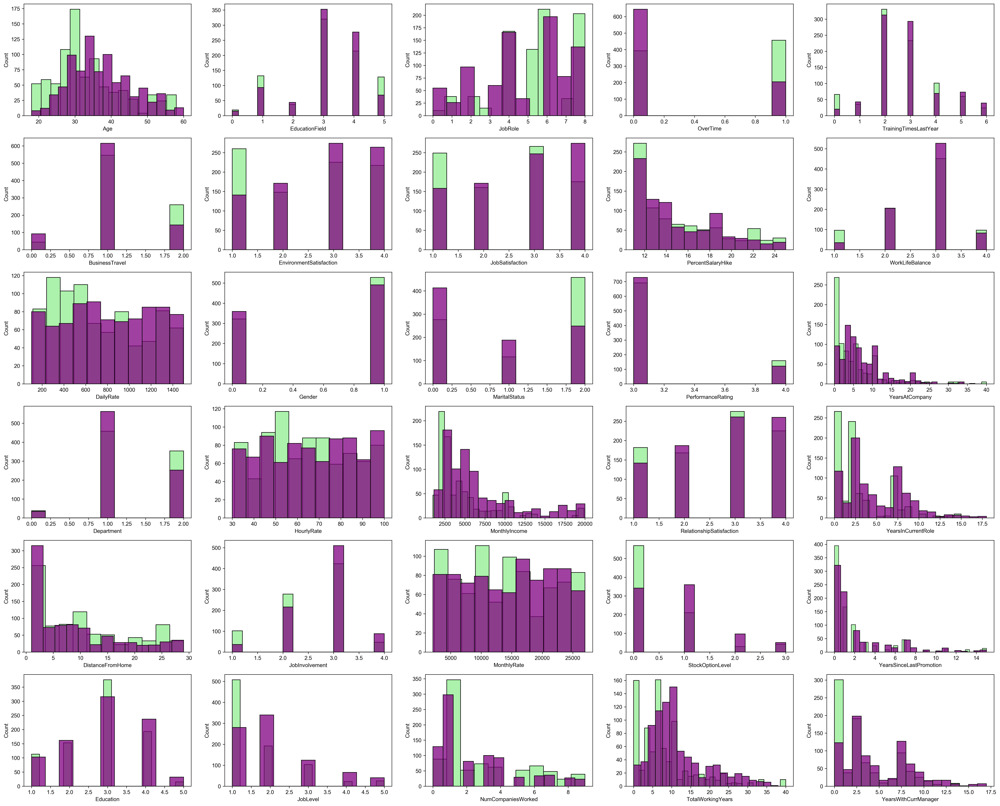

In [13]:
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(32, 26), dpi=300)

for i,feature in enumerate(features):
    sns.histplot(data=designed, x=feature, ax=axes[i%6,i//6], color='lightgreen')
    sns.histplot(data=undesign, x=feature, ax=axes[i%6,i//6], color='purple')

### 连续型变量

因为样本数量上的差异，采用频数进行可视化效果比较差，故考虑对连续型变量采用核密度估计图(kds)

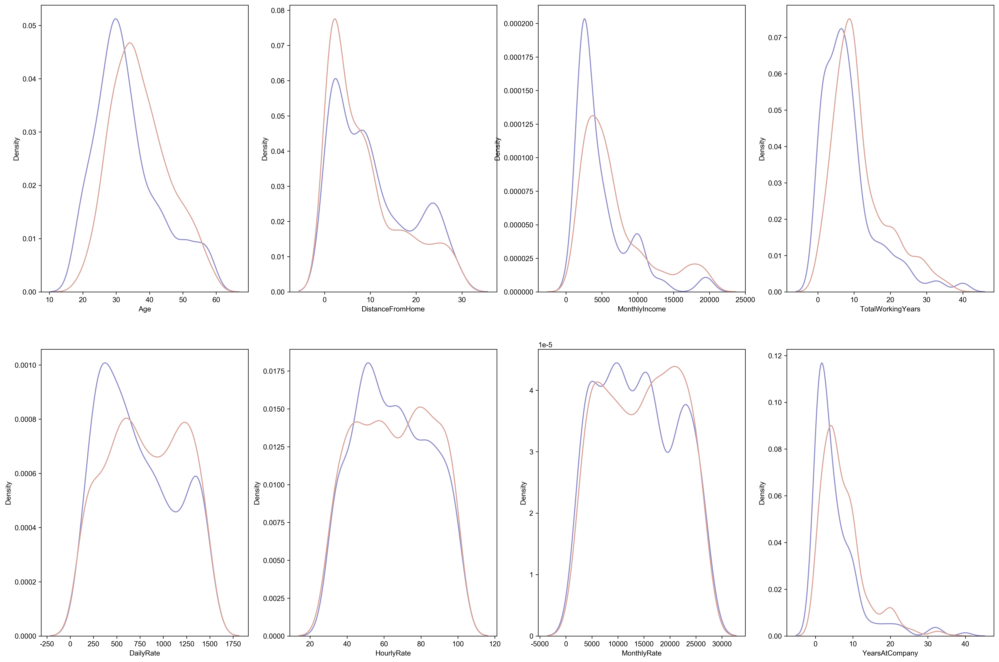

In [14]:
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(24, 16), dpi=300)

for i,feature in enumerate(continuous_feature):
    sns.kdeplot(data=designed, x=feature, ax=axes[i%2,i//2], color=[142/255,141/255,200/255])
    sns.kdeplot(data=undesign, x=feature, ax=axes[i%2,i//2], color=[216/255,163/255,152/255])

两个样本中连续型变量的分布都呈现着较大差异，分布体现在 偏移、 偏态、 多峰

可认为这些变量都对离职具有影响



| 观察点             | 意义                     |
|--------------------|--------------------------|
| 曲线位置不同       | 存在群体差异，有判别力   |
| 曲线重叠严重       | 差异不明显，解释力弱     |
| 峰值位置和形状     | 反映常见值、集中趋势     |
| 偏态或多峰         | 潜在子群体、非对称结构   |


### 离散型变量

因样本差异过大，考虑绘制频率直方图进行可视化

In [15]:
designed['JobInvolvement'].value_counts(normalize=True)

JobInvolvement
3.0    0.497647
2.0    0.327059
1.0    0.120000
4.0    0.055294
Name: proportion, dtype: float64

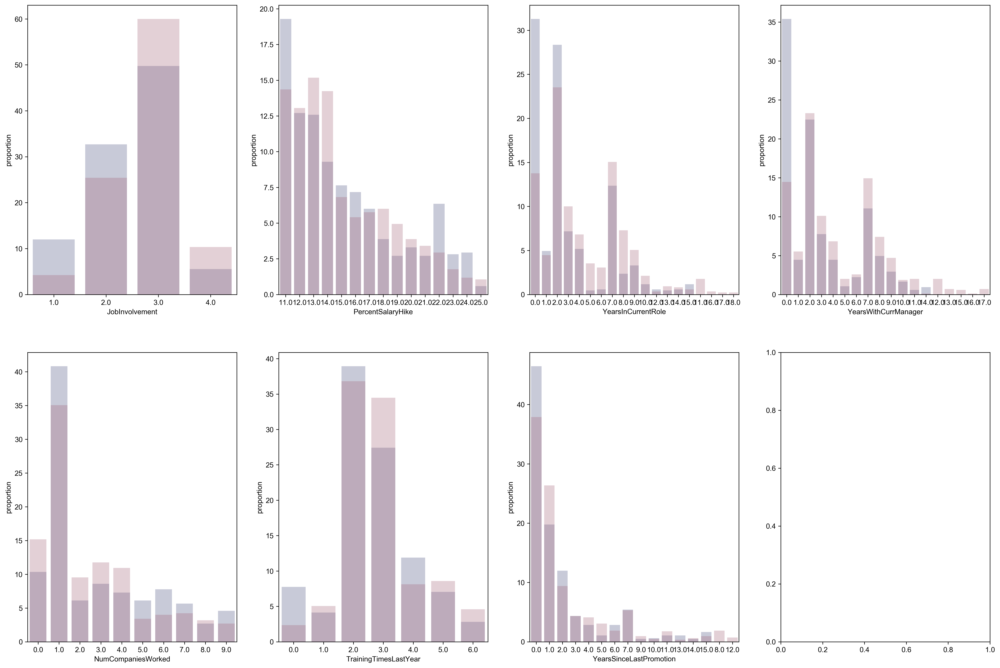

In [16]:
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(24, 16), dpi=300)

for i,feature in enumerate(discrete_feature):
    sns.barplot(data=designed[feature].value_counts(normalize=True).mul(100), ax=axes[i%2, i//2], color=[65/255,76/255,135/255],alpha=0.3)
    sns.barplot(data=undesign[feature].value_counts(normalize=True).mul(100), ax=axes[i%2, i//2], color=[175/255,90/255,118/255],alpha=0.3)

可见， JobInvolvement 变量分布较相似，其余变量分布均差异较大

### 名义型变量

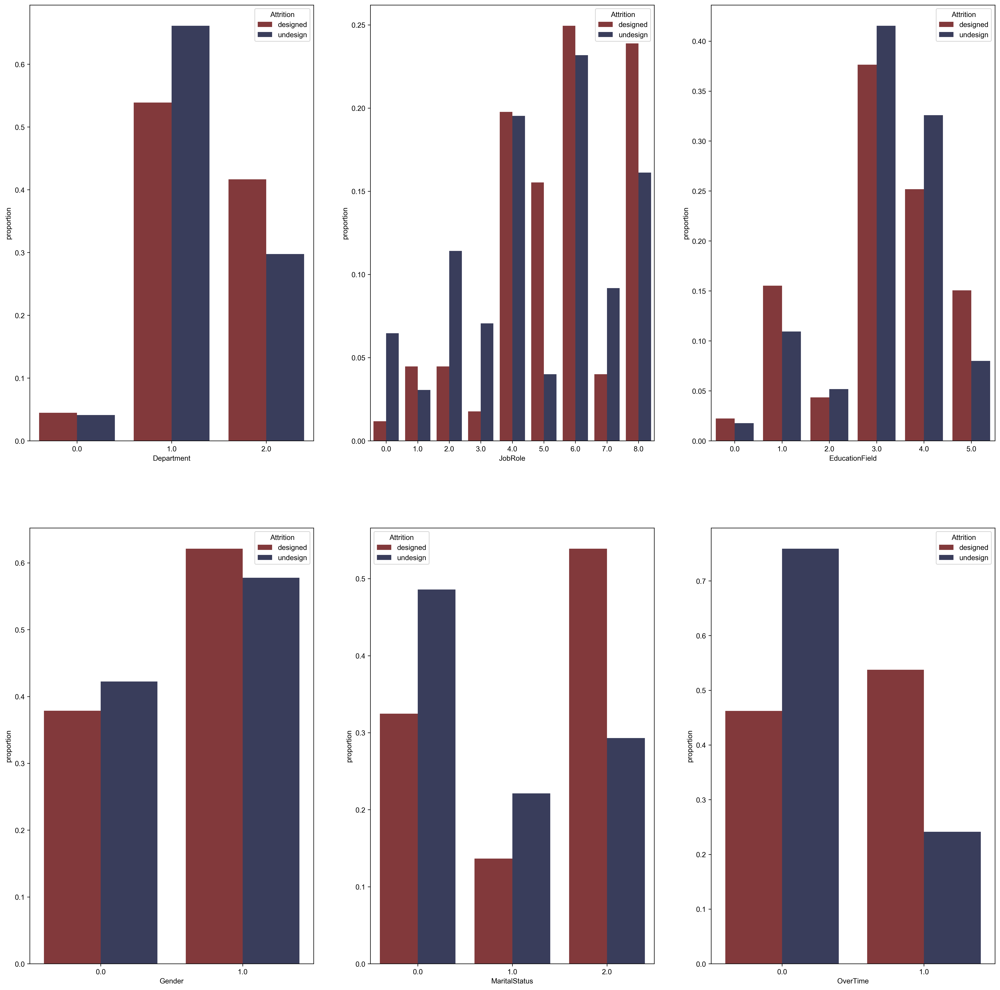

In [17]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(24, 24), dpi=300)

for i,feature in enumerate(nominal_feature):
    d1 = designed[feature].value_counts(normalize=True).rename('proportion').reset_index()
    d2 = undesign[feature].value_counts(normalize=True).rename('proportion').reset_index()

    d1['Attrition'] = 'designed'
    d2['Attrition'] = 'undesign'

    d1.columns = [feature, 'proportion', 'Attrition']
    d2.columns = [feature, 'proportion', 'Attrition']

    df_plot = pd.concat([d1, d2])

    # 设置顺序性（有序变量）
    df_plot[feature] = pd.Categorical(df_plot[feature], ordered=True)

    ax = axes[i // 3, i % 3]
    sns.barplot(data=df_plot, x=feature, y='proportion', hue='Attrition', ax=ax,
                palette=[[142/255,45/255,48/255], [51/255,57/255,97/255]])

# 以下为重合柱状图
# fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(24, 16), dpi=300)

# for i,feature in enumerate(nominal_feature):
#     sns.barplot(data=designed[feature].value_counts(normalize=True).mul(100), ax=axes[i%2, i//2], color=[142/255,45/255,48/255],alpha=0.8)
#     sns.barplot(data=undesign[feature].value_counts(normalize=True).mul(100), ax=axes[i%2, i//2], color=[51/255,57/255,97/255],alpha=0.8)

可见，Department、EducationField 和 Gender 的分布较相似

### 有序型变量

#### 柱状图

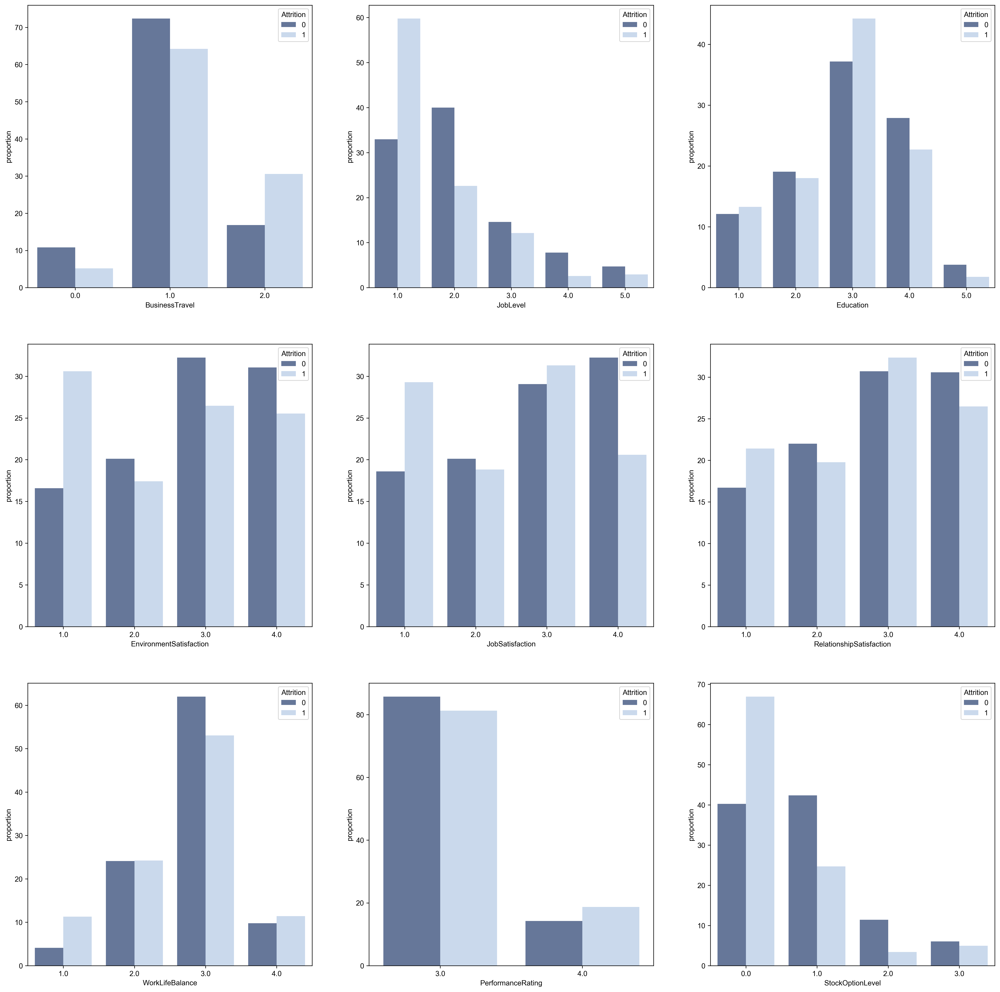

In [18]:
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(24, 24), dpi=300)

for i,feature in enumerate(ordinal_feature):
    df_plot = data[[feature,'Attrition']].copy()
    # 先计算每个类别的比例
    proportion_map = df_plot.groupby('Attrition')[feature].value_counts(normalize=True).mul(100)
    
    # 使用 apply 对每行进行映射：根据所在组和类别取对应的百分比值
    # axis=1 , 每次传入一行
    df_plot['proportion'] = df_plot.apply(
        lambda row: proportion_map.loc[row['Attrition'], row[feature]], axis=1
    )
    
    # 设置有序变量
    df_plot[feature] = pd.Categorical(df_plot[feature], ordered=True)

    ax = axes[i // 3, i % 3]
    sns.barplot(data=df_plot, x=feature, y='proportion', hue='Attrition', ax=ax,
                palette=[[93/255,116/255,162/255], [196/255,216/255,242/255]])

#### 箱线图

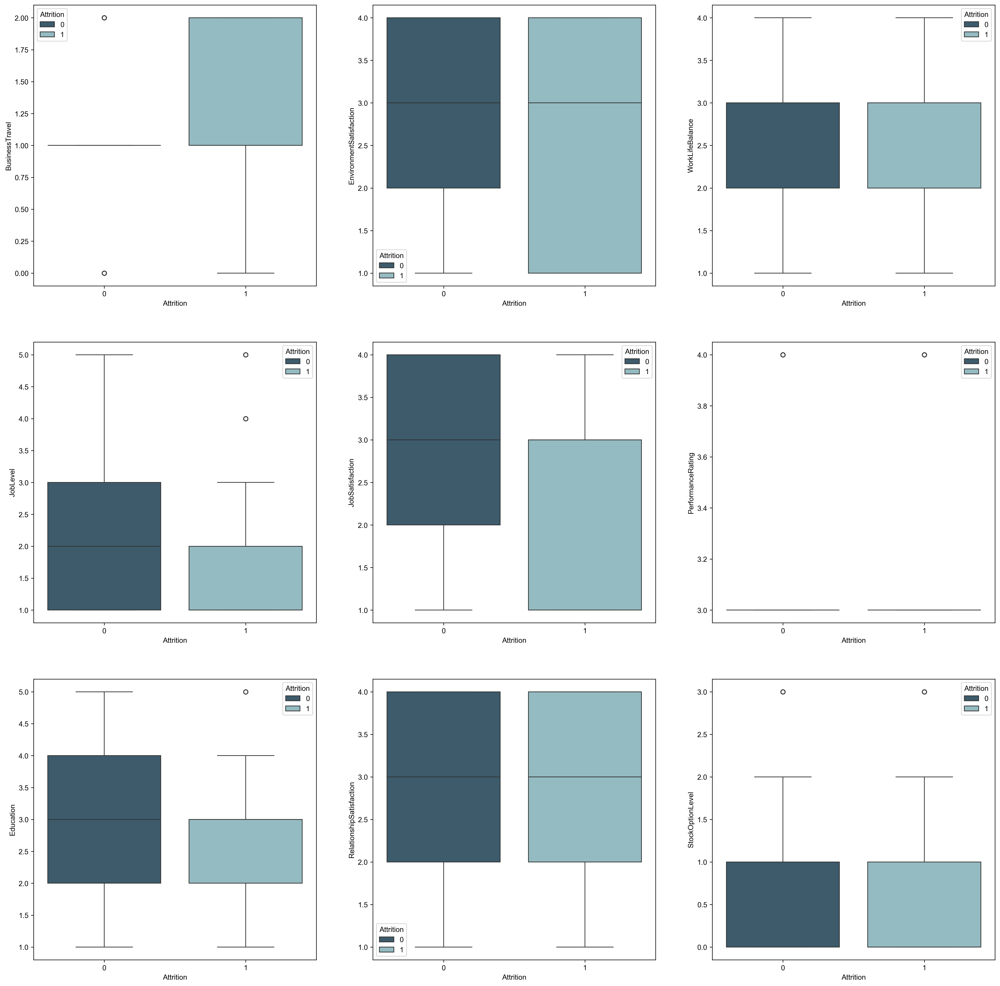

In [19]:
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(24, 24), dpi=300)

for i, feature in enumerate(ordinal_feature):
    sns.boxplot(data=data, x='Attrition', y=feature, hue='Attrition', ax=axes[i%3, i//3], palette=[[53/255,93/255,115/255],[141/255,192/255,200/255]])



    RelationshipSatisfaction,WorkLifeBalance,StockOptionLevel

这三个变量的箱线图非常接近，考虑其分布也可能很类似

#### 折线图

In [20]:
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(24, 24), dpi=300)

for i, feature in enumerate(ordinal_feature):
    df_plot = data[[feature, 'Attrition']].copy()
    
    # 计算每个 Attrition 组内该变量各类别的百分比
    proportion_map = df_plot.groupby('Attrition')[feature].value_counts(normalize=True).mul(100)
    
    # 对每行用 apply 映射对应的百分比值
    df_plot['proportion'] = df_plot.apply(
        lambda row: proportion_map.loc[row['Attrition'], row[feature]], axis=1
    )
    
    # 设置变量为有序类型，确保 x 轴顺序正确
    df_plot[feature] = pd.Categorical(df_plot[feature], ordered=True)
    
    # 根据 feature 和 Attrition 分组，计算均值（这里每个组只有一个唯一值，聚合后方便绘图）
    df_line = df_plot.groupby([feature, 'Attrition'])['proportion'].mean().reset_index()
    
    ax = axes[i // 3, i % 3]
    sns.lineplot(data=df_line, x=feature, y='proportion', hue='Attrition', marker='o', ax=ax,
                 palette=[[152/255, 114/255, 202/255], [53/255, 38/255, 96/255]])
    ax.set_title(f"{feature}")
    ax.set_ylabel("percent (%)")
    ax.set_xlabel(feature)

plt.tight_layout()
plt.show()


/var/folders/y2/wt3c181576xcp7vkwx_d9h1h0000gn/T/ipykernel_61919/885564837.py:18: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_line = df_plot.groupby([feature, 'Attrition'])['proportion'].mean().reset_index()
/var/folders/y2/wt3c181576xcp7vkwx_d9h1h0000gn/T/ipykernel_61919/885564837.py:18: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_line = df_plot.groupby([feature, 'Attrition'])['proportion'].mean().reset_index()
/var/folders/y2/wt3c181576xcp7vkwx_d9h1h0000gn/T/ipykernel_61919/885564837.py:18: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version o

从折线图可以看出，BusinessTravel 、 Education、WorkLifeBalance 和 PerformanceRating 的分布较相似

综合以上分布信息，可先初略认为

    JobInvolvement,Department,EducationField,Gender,BusinessTravel,Education,WorkLifeBalance,PerformanceRating

这些变量对离职的影响较小，可先删去

In [21]:
drop_cols = ['JobInvolvement','Department','EducationField','Gender','BusinessTravel','Education','WorkLifeBalance','PerformanceRating']
data.drop(labels=drop_cols, axis=1, inplace=True)

# 相关性分析

In [22]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1700 entries, 0 to 1699
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Age                       1700 non-null   float64
 1   Attrition                 1700 non-null   int64  
 2   DailyRate                 1700 non-null   float64
 3   DistanceFromHome          1700 non-null   float64
 4   EnvironmentSatisfaction   1700 non-null   float64
 5   HourlyRate                1700 non-null   float64
 6   JobLevel                  1700 non-null   float64
 7   JobRole                   1700 non-null   float64
 8   JobSatisfaction           1700 non-null   float64
 9   MaritalStatus             1700 non-null   float64
 10  MonthlyIncome             1700 non-null   float64
 11  MonthlyRate               1700 non-null   float64
 12  NumCompaniesWorked        1700 non-null   float64
 13  OverTime                  1700 non-null   float64
 14  PercentS

## 数值型变量

In [23]:
numerical_cols = list(
    set(numerical_feature) - set(['JobInvolvement'])
)

<Axes: >

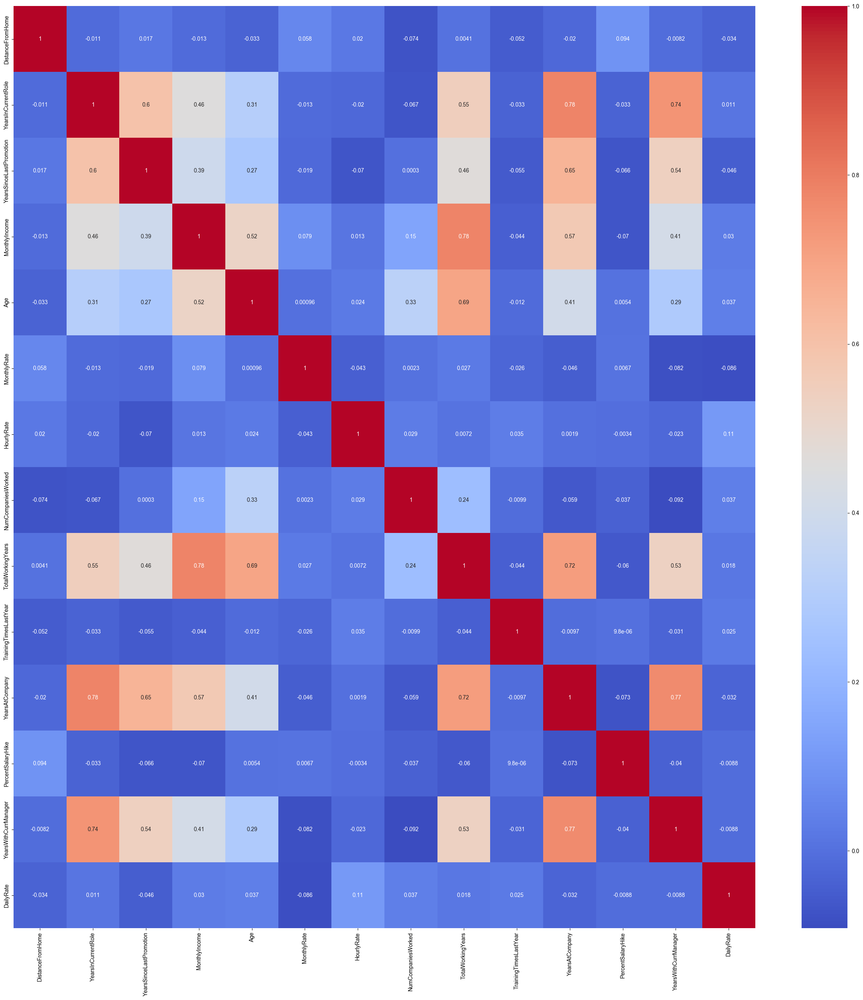

In [24]:
numeric_data = pd.DataFrame()

for feature in numerical_cols:
    numeric_data[feature] = data[feature]

#==================================================
###     注意这里是 皮尔逊 —— pearson
#==================================================
corr_data = numeric_data.corr(method='pearson')

plt.figure(figsize=(30,30))
sns.heatmap(data= corr_data, cmap='coolwarm', annot=True, fmt='.2g')

<font size=5>假定相关系数大于等于 0.75 时具有比较强的相关性</font>

可见， 

    Monthlyincome 与 TotalWorkingYears —— 0.75

    YearsAtCompany 与 YearsinCurrentRole —— 0.78

    YearsAtCompany 与 YearsWithCurrManager —— 0.78

In [25]:
# USING PCA TO ADDRESSING MULTICOLINEARITY
zscore = StandardScaler()

# NORMALIZATION
multi_cols = data[['MonthlyIncome','TotalWorkingYears']]   # COLUMN THAT HAS MULTICOLINEARITY
multi_cols = zscore.fit_transform(multi_cols)

# FIND PRINCIPAL COMPONENT OPTIMAL
pca  = PCA(n_components=None)
pca.fit_transform(multi_cols)


print(f'Number of Components : {pca.n_components_}')
print(f'Ratio every Component / PC : {pca.explained_variance_ratio_}\n')
print(f'PCA Components : \n{pca.components_}\n')
print('---------------------------------')

Number of Components : 2
Ratio every Component / PC : [0.89071087 0.10928913]

PCA Components : 
[[ 0.70710678  0.70710678]
 [-0.70710678  0.70710678]]

---------------------------------


In [26]:
# CHOOSE PC1

pca_1  = PCA(n_components=1)
multi_cols_1 = pca_1.fit_transform(multi_cols)

# ADD PC1 TO DATAFRAME
data['multi_cols_1'] = multi_cols_1.ravel()

"""
    ravel()函数的作用是将多维数组​​展平为一维数组​​。
    multi_cols_1是通过PCA降维后得到的二维数组(形状为(n_samples, 1)),
    而ravel()将其转换为形状为(n_samples,)的一维数组,以便与DataFrame的列对齐
"""

'\n    ravel()函数的作用是将多维数组\u200b\u200b展平为一维数组\u200b\u200b。\n    multi_cols_1是通过PCA降维后得到的二维数组(形状为(n_samples, 1)),\n    而ravel()将其转换为形状为(n_samples,)的一维数组,以便与DataFrame的列对齐\n'

In [27]:
data['JobStability'] = data['YearsInCurrentRole'] / data['YearsAtCompany']
data['LeaderTurnRate'] = data['YearsAtCompany'] - data['YearsWithCurrManager'] 

<Axes: >

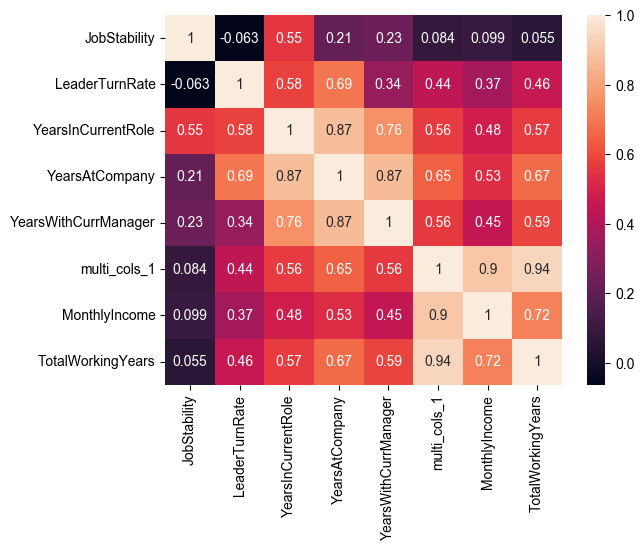

In [28]:
multi = data[['JobStability', 'LeaderTurnRate','YearsInCurrentRole','YearsAtCompany','YearsWithCurrManager',
             'multi_cols_1', 'MonthlyIncome','TotalWorkingYears' ]]
multiq = multi.corr(method='spearman')

sns.heatmap(data=multiq, annot=True, fmt='.2g')

In [29]:
multi_corr = ['YearsInCurrentRole','YearsAtCompany','YearsWithCurrManager','MonthlyIncome','TotalWorkingYears']

data.drop(labels= multi_corr, axis=1, inplace=True )

data.head()

,Age,Attrition,DailyRate,DistanceFromHome,EnvironmentSatisfaction,HourlyRate,JobLevel,JobRole,JobSatisfaction,MaritalStatus,...,NumCompaniesWorked,OverTime,PercentSalaryHike,RelationshipSatisfaction,StockOptionLevel,TrainingTimesLastYear,YearsSinceLastPromotion,multi_cols_1,JobStability,LeaderTurnRate
0,37.0,0,558.0,2.0,4.0,75.0,2.0,6.0,3.0,0.0,...,4.0,1.0,11.0,3.0,1.0,3.0,1.0,1.241138,0.000000,3.0
1,33.0,0,1038.0,8.0,2.0,88.0,1.0,5.0,4.0,2.0,...,0.0,0.0,19.0,4.0,0.0,2.0,2.0,-1.190302,1.000000,0.0
2,45.0,0,1015.0,5.0,3.0,50.0,2.0,8.0,1.0,2.0,...,1.0,1.0,14.0,1.0,0.0,3.0,1.0,-0.007036,0.700000,6.0
3,36.0,0,164.0,2.0,2.0,61.0,3.0,6.0,3.0,0.0,...,1.0,0.0,13.0,2.0,2.0,2.0,9.0,0.285050,0.900000,10.0
4,44.0,0,477.0,7.0,1.0,42.0,3.0,7.0,4.0,0.0,...,3.0,0.0,14.0,4.0,1.0,4.0,5.0,1.979799,0.272727,5.0


## 有序型变量

In [30]:
ordinal_cols = list(
    set(ordinal_feature) - set(['BusinessTravel','Education','WorkLifeBalance','PerformanceRating'])
)

<Axes: >

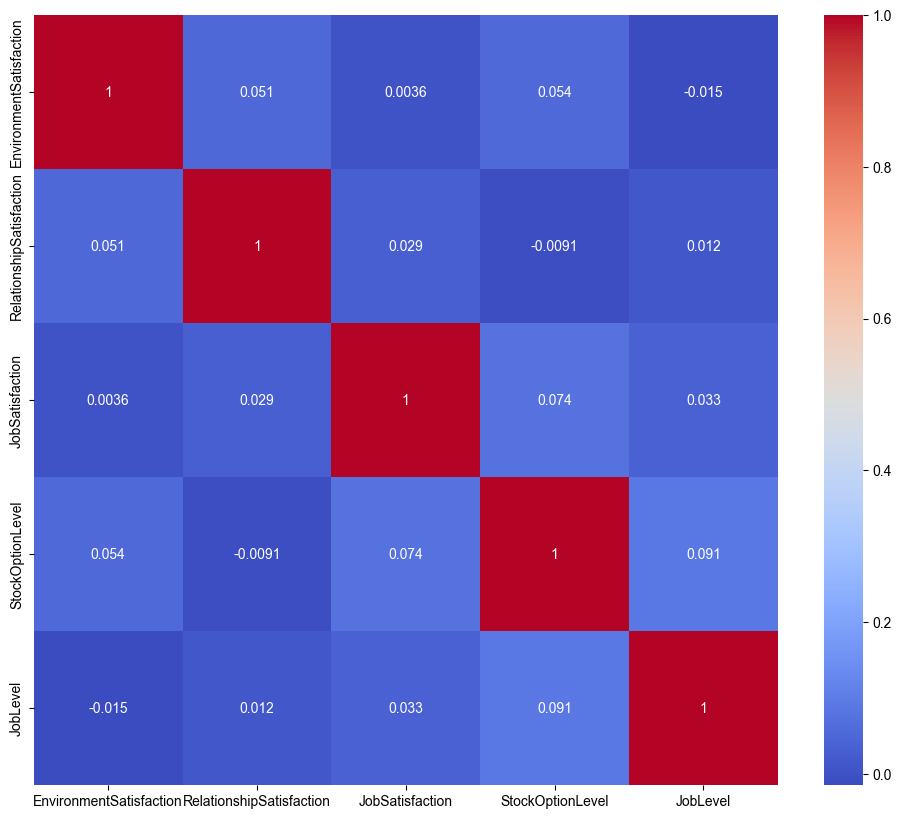

In [31]:
#==================================================
###     注意这里是  Spearman
#==================================================
spearman_corr = data[ordinal_cols].corr(method='spearman')

plt.figure(figsize=(12,10))
sns.heatmap(data= spearman_corr, cmap='coolwarm', annot=True, fmt='.2g')

# 关联性分析

In [32]:
nominal_cols = list(
    set(nominal_feature) - set(['Department','EducationField','Gender'])
)

In [33]:
def cramers_v(confusion_matrix):
    """
    计算 Cramer's V 值。confusion_matrix 为列联表，
    返回的 V 值范围 [0, 1]，数值越大表示两个变量之间的关联程度越高。
    """
    # 卡方统计量、p 值、自由度和期望频数
    chi2, _, _, _ = chi2_contingency(confusion_matrix)
    n = confusion_matrix.to_numpy().sum()  # 样本总数
    phi2 = chi2 / n
    r, k = confusion_matrix.shape
    # 避免除零错误，取较小的自由度
    denom = min(k - 1, r - 1)
    if denom == 0:
        return np.nan
    return np.sqrt(phi2 / denom)

In [34]:
# 创建一个空的 DataFrame 用来存储 Cramer’s V 值矩阵（对称矩阵）
n = len(nominal_cols)
cramers_v_matrix = pd.DataFrame(np.zeros((n, n)), index=nominal_cols, columns=nominal_cols)

# 两两计算名义变量间的 Cramer’s V
for i in range(n):
    for j in range(i, n):
        if i == j:
            # 同一变量的相关性为 1
            cramers_v_matrix.iloc[i, j] = 1.0
        else:
            feat1 = nominal_cols[i]
            feat2 = nominal_cols[j]
            # 构造列联表
            contingency_table = pd.crosstab(data[feat1], data[feat2])
            # 计算 Cramer’s V
            cv = cramers_v(contingency_table)
            cramers_v_matrix.iloc[i, j] = cv
            cramers_v_matrix.iloc[j, i] = cv  # 填充对称位置

<Axes: >

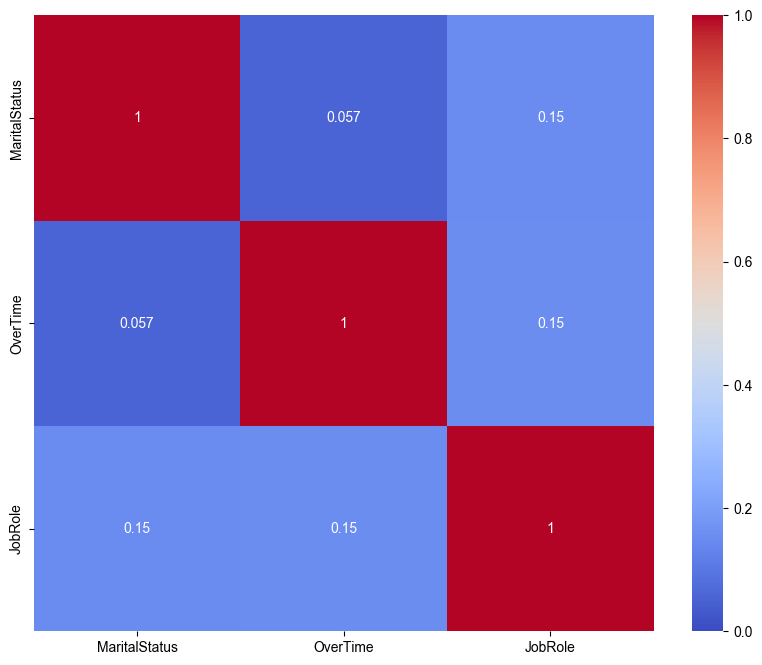

In [35]:
plt.figure(figsize=(10, 8))
sns.heatmap(cramers_v_matrix, annot=True, cmap='coolwarm', vmin=0, vmax=1)

# 数据处理

In [36]:
data.isna().sum()

Age                          0
Attrition                    0
DailyRate                    0
DistanceFromHome             0
EnvironmentSatisfaction      0
HourlyRate                   0
JobLevel                     0
JobRole                      0
JobSatisfaction              0
MaritalStatus                0
MonthlyRate                  0
NumCompaniesWorked           0
OverTime                     0
PercentSalaryHike            0
RelationshipSatisfaction     0
StockOptionLevel             0
TrainingTimesLastYear        0
YearsSinceLastPromotion      0
multi_cols_1                 0
JobStability                84
LeaderTurnRate               0
dtype: int64

此处经检查发现构建的新特征 JobStability 存在空值，可能是因计算时分母 YearsAtCompany 为0导致

不妨将空值填充为0，在职未满一年可认为稳定性较差

In [37]:
data['JobStability'].fillna(value=0,inplace=True)
data.isna().sum()

/var/folders/y2/wt3c181576xcp7vkwx_d9h1h0000gn/T/ipykernel_61919/797956042.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data['JobStability'].fillna(value=0,inplace=True)


Age                         0
Attrition                   0
DailyRate                   0
DistanceFromHome            0
EnvironmentSatisfaction     0
HourlyRate                  0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyRate                 0
NumCompaniesWorked          0
OverTime                    0
PercentSalaryHike           0
RelationshipSatisfaction    0
StockOptionLevel            0
TrainingTimesLastYear       0
YearsSinceLastPromotion     0
multi_cols_1                0
JobStability                0
LeaderTurnRate              0
dtype: int64

## Transformation

先来观察一下连续型变量的偏态分布

In [38]:
continuous_cols = list(
    set(continuous_feature) - set(['MonthlyIncome', 'TotalWorkingYears', 'YearsAtCompany']) 
)
continuous_cols = list(
    set(continuous_cols).union({'multi_cols_1', 'JobStability', 'LeaderTurnRate'})
)

continuous_cols

['HourlyRate',
 'LeaderTurnRate',
 'DistanceFromHome',
 'multi_cols_1',
 'MonthlyRate',
 'DailyRate',
 'Age',
 'JobStability']

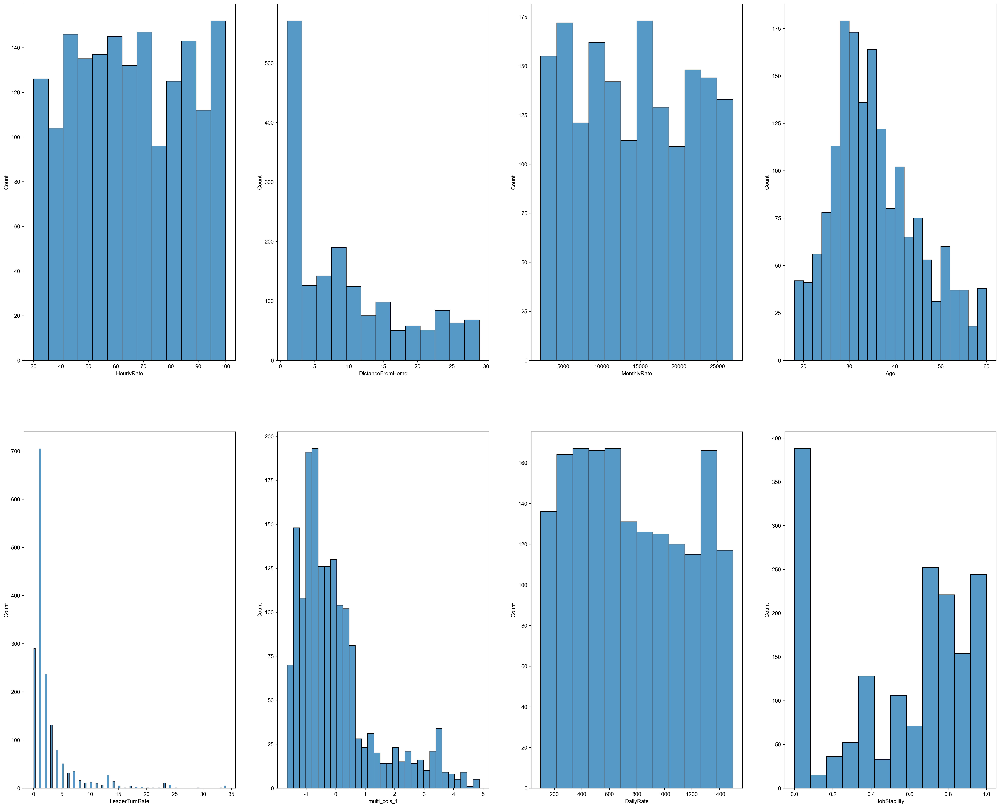

In [39]:
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(32, 26), dpi=300)

for i,feature in enumerate(continuous_cols):
    sns.histplot(data=data, x=feature, ax=axes[i%2,i//2])


计算偏度

In [40]:
transform_data = data[continuous_cols]
skewness = transform_data.skew().sort_values(ascending=False)

skewness

LeaderTurnRate      3.597622
multi_cols_1        1.450049
DistanceFromHome    0.816545
Age                 0.541474
DailyRate           0.162928
MonthlyRate         0.046285
HourlyRate          0.040480
JobStability       -0.361466
dtype: float64

对偏度大于 1 或者小于 -1 的变量进行转换 

In [41]:
cols_to_transform = ['LeaderTurnRate','multi_cols_1','DistanceFromHome']  

for col in cols_to_transform:
    yeo_johnson = PowerTransformer(method='yeo-johnson', standardize=True, copy=True)
    data[[col]] = yeo_johnson.fit_transform(data[[col]])

可视化转换结果

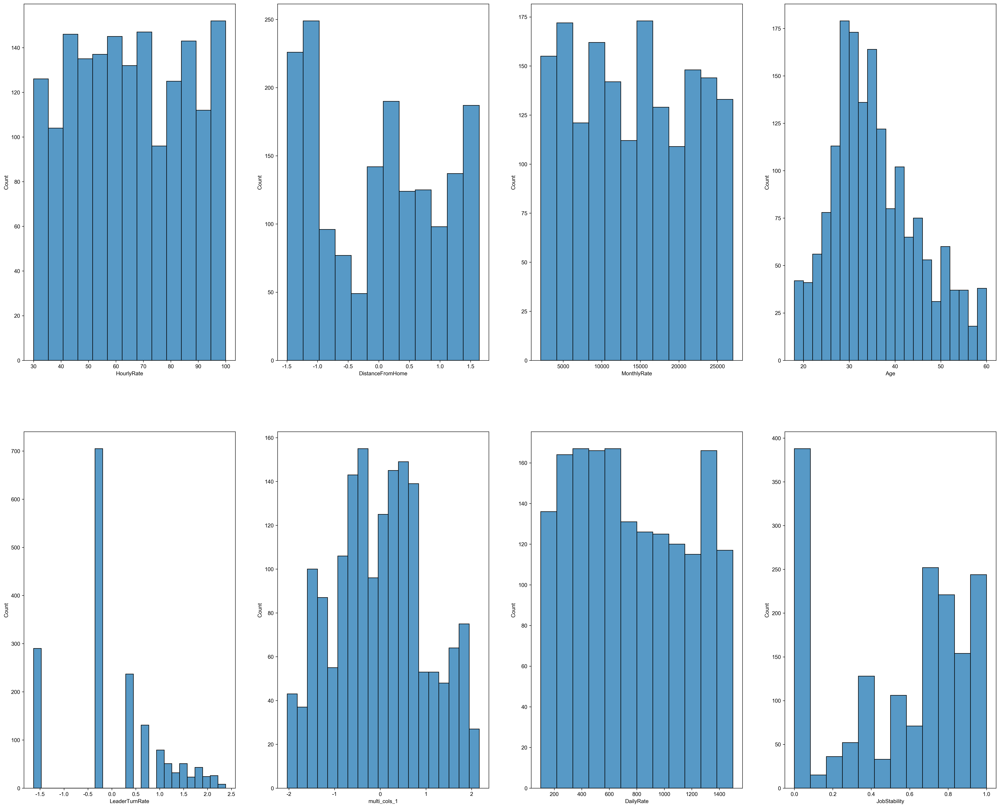

In [42]:
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(32, 26), dpi=300)

for i,feature in enumerate(continuous_cols):
    sns.histplot(data=data, x=feature, ax=axes[i%2,i//2])


## 标准化

对于存在较多异常值且不服从正态分布的特征，使用 鲁棒标准化（Robust Scaling）

对于接近正态分布的特征，使用 Z-score 标准化（Z-score Normalization）

In [43]:
continuous_cols

['HourlyRate',
 'LeaderTurnRate',
 'DistanceFromHome',
 'multi_cols_1',
 'MonthlyRate',
 'DailyRate',
 'Age',
 'JobStability']

In [44]:
# NORMALIZATION

# CHOOSE COLUMNS TO NORMALIZE
cols_to_robust = ['HourlyRate','DailyRate','MonthlyRate','DistanceFromHome','LeaderTurnRate','JobStability']
cols_to_zscore = ['multi_cols_1','Age']

# ROBUST SCALING NORM
robust = RobustScaler()
robust.fit(data[cols_to_robust])

data[cols_to_robust] = robust.transform(data[cols_to_robust])

# ZSCORE NORM
zscore = StandardScaler()
zscore.fit(data[cols_to_zscore])

data[cols_to_zscore] = zscore.transform(data[cols_to_zscore])


# K-means

## 确定簇的数量

### 肘部法则

通过绘制不同 K 值对应的总平方误差（SSE）图，选择拐点处的 K 值

In [45]:
df = data.drop(labels='Attrition', axis=1)

# 确定最佳聚类数 K
sse = []
silhouette_scores = []
K_range = range(2, 20)
for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(df)
    sse.append(kmeans.inertia_)
    silhouette_scores.append(silhouette_score(df, kmeans.labels_))

Text(0, 0.5, 'SSE')

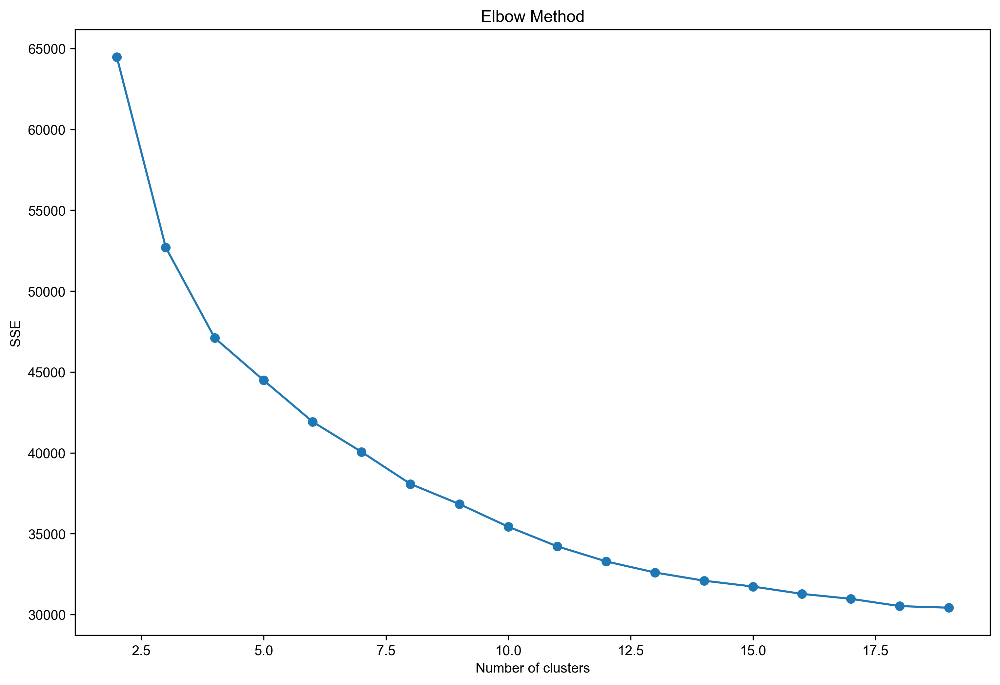

In [46]:
# 绘制肘部法则图
plt.figure(figsize=(12, 8), dpi=300)
plt.plot(K_range, sse, marker='o')
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('SSE')

从图上来看，在 K=4 或 K=5 处，曲线的斜率开始变缓

### 轮廓系数

​评估不同 K 值下聚类的紧密度和分离度，选择轮廓系数最大的 K 值。​

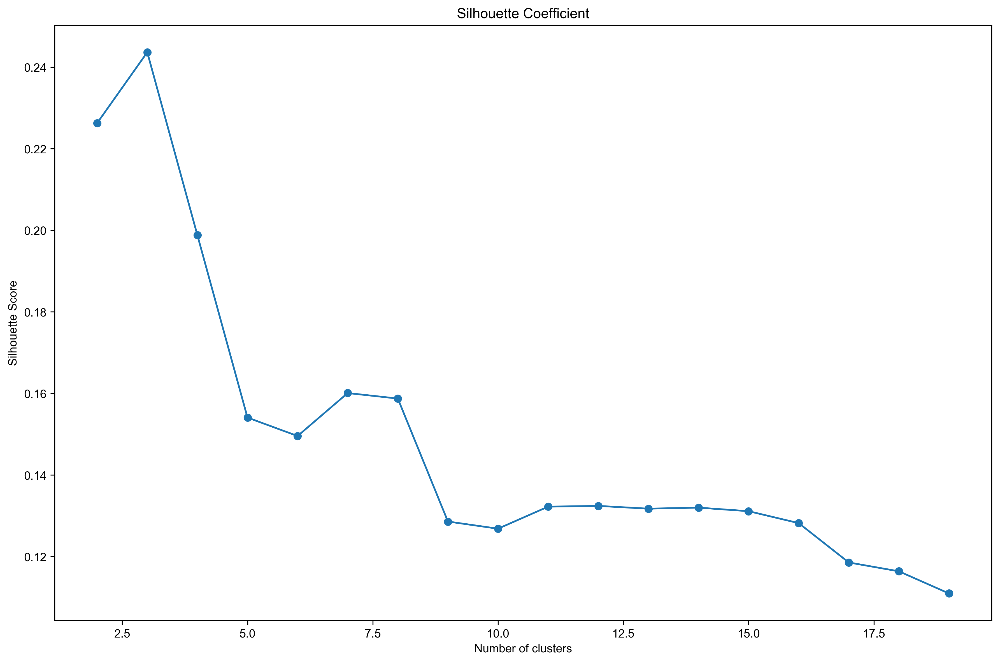

In [47]:
# 绘制轮廓系数图
plt.figure(figsize=(12, 8), dpi=300)
plt.plot(K_range, silhouette_scores, marker='o')
plt.title('Silhouette Coefficient')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')
plt.tight_layout()
plt.show()

最高值出现在 K=2，然后随 K 增大而逐步下降

## 聚类

### K = 2

In [48]:
# 选择最佳 K 值后，重新训练模型
optimal_k = 2  # 根据上图选择最佳的 K 值
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
df['Cluster'] = kmeans.fit_predict(df)

# 查看每个聚类的样本数量
print("\nCluster Counts:")
print(df['Cluster'].value_counts())


Cluster Counts:
Cluster
0    1176
1     524
Name: count, dtype: int64


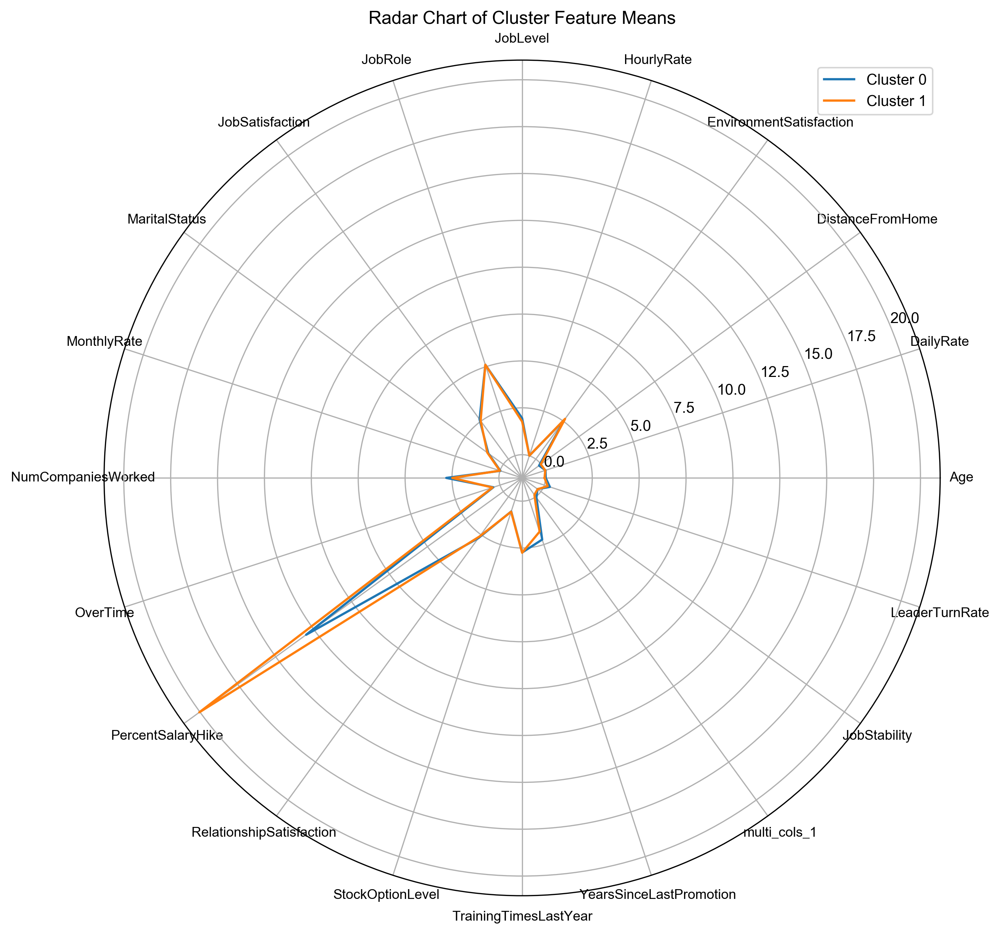

In [49]:
cluster_profiles = df.groupby('Cluster').mean()

# 雷达图绘制
features = cluster_profiles.columns
num_features = len(features)

angles = np.linspace(0, 2 * np.pi, num_features, endpoint=False).tolist()
angles += angles[:1]  # 闭合图形

plt.figure(figsize=(10, 10), dpi=300)
for i in range(cluster_profiles.shape[0]):
    values = cluster_profiles.iloc[i].tolist()
    values += values[:1]
    plt.polar(angles, values, label=f'Cluster {i}')
plt.xticks(angles[:-1], features, fontsize=9)
plt.title("Radar Chart of Cluster Feature Means")
plt.legend()
plt.show()

### K = 3

In [50]:
optimal_k = 3  # 根据上图选择最佳的 K 值
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
df['Cluster'] = kmeans.fit_predict(df)

# 查看每个聚类的样本数量
print("\nCluster Counts:")
print(df['Cluster'].value_counts())


Cluster Counts:
Cluster
2    971
1    498
0    231
Name: count, dtype: int64


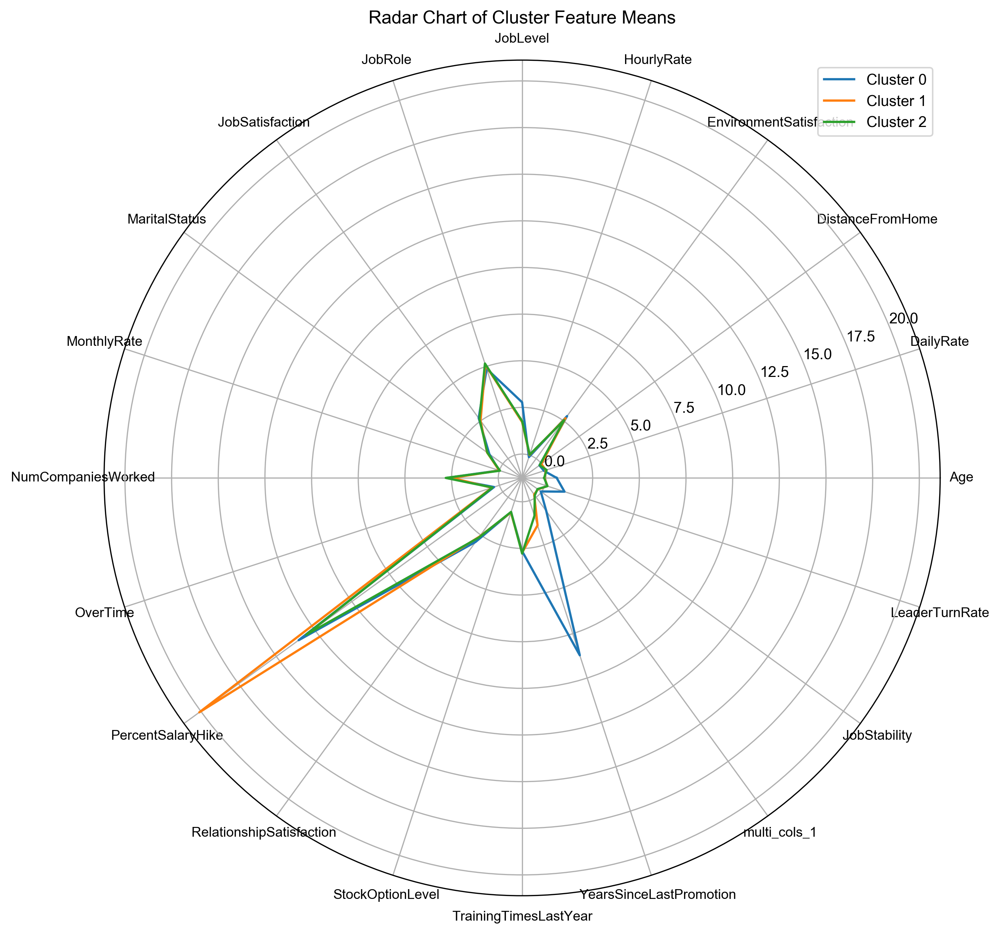

In [51]:
cluster_profiles = df.groupby('Cluster').mean()

# 雷达图绘制
features = cluster_profiles.columns
num_features = len(features)

angles = np.linspace(0, 2 * np.pi, num_features, endpoint=False).tolist()
angles += angles[:1]  # 闭合图形

plt.figure(figsize=(10, 10), dpi=300)
for i in range(cluster_profiles.shape[0]):
    values = cluster_profiles.iloc[i].tolist()
    values += values[:1]
    plt.polar(angles, values, label=f'Cluster {i}')
plt.xticks(angles[:-1], features, fontsize=9)
plt.title("Radar Chart of Cluster Feature Means")
plt.legend()
plt.show()

### K = 4

In [52]:
optimal_k = 4  # 根据上图选择最佳的 K 值
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
df['Cluster'] = kmeans.fit_predict(df)

# 查看每个聚类的样本数量
print("\nCluster Counts:")
print(df['Cluster'].value_counts())


Cluster Counts:
Cluster
2    714
3    454
0    321
1    211
Name: count, dtype: int64


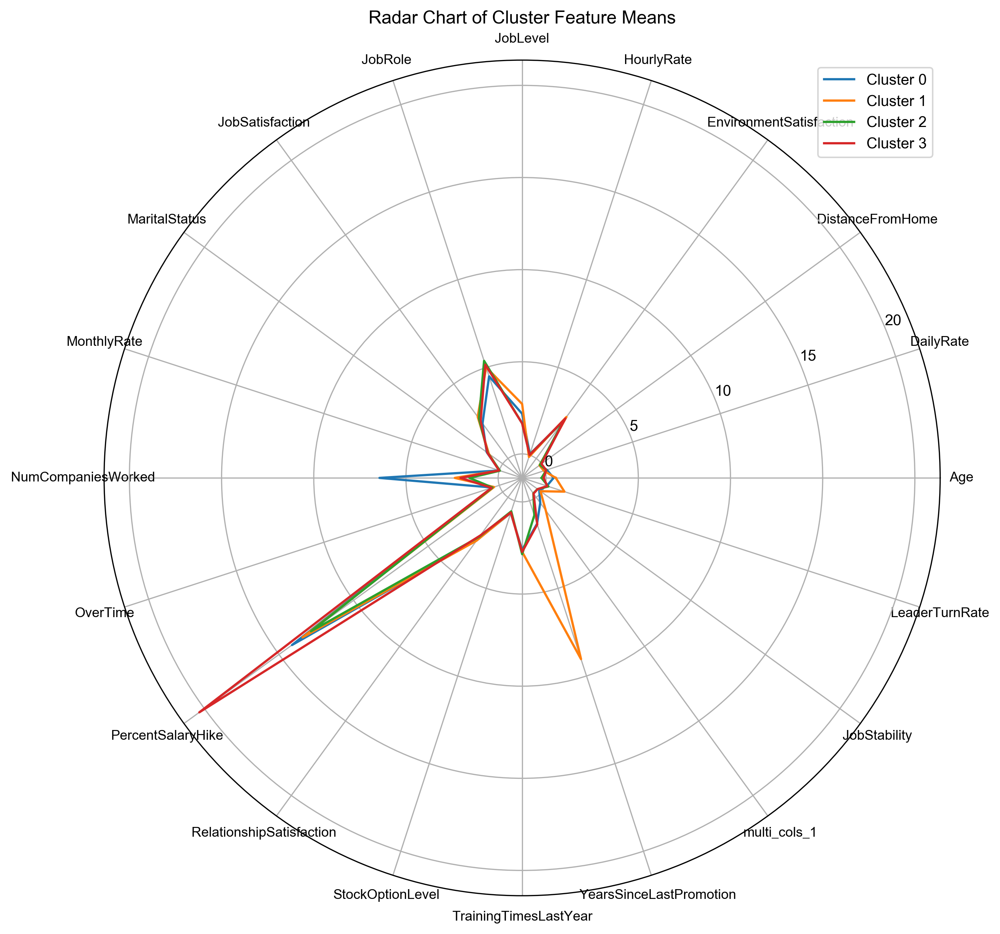

In [53]:
cluster_profiles = df.groupby('Cluster').mean()

# 雷达图绘制
features = cluster_profiles.columns
num_features = len(features)

angles = np.linspace(0, 2 * np.pi, num_features, endpoint=False).tolist()
angles += angles[:1]  # 闭合图形

plt.figure(figsize=(10, 10), dpi=300)
for i in range(cluster_profiles.shape[0]):
    values = cluster_profiles.iloc[i].tolist()
    values += values[:1]
    plt.polar(angles, values, label=f'Cluster {i}')
plt.xticks(angles[:-1], features, fontsize=9)
plt.title("Radar Chart of Cluster Feature Means")
plt.legend()
plt.show()

### K = 5

In [54]:
optimal_k = 5  # 根据上图选择最佳的 K 值
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
df['Cluster'] = kmeans.fit_predict(df)

# 查看每个聚类的样本数量
print("\nCluster Counts:")
print(df['Cluster'].value_counts())


Cluster Counts:
Cluster
1    593
0    320
4    291
2    289
3    207
Name: count, dtype: int64


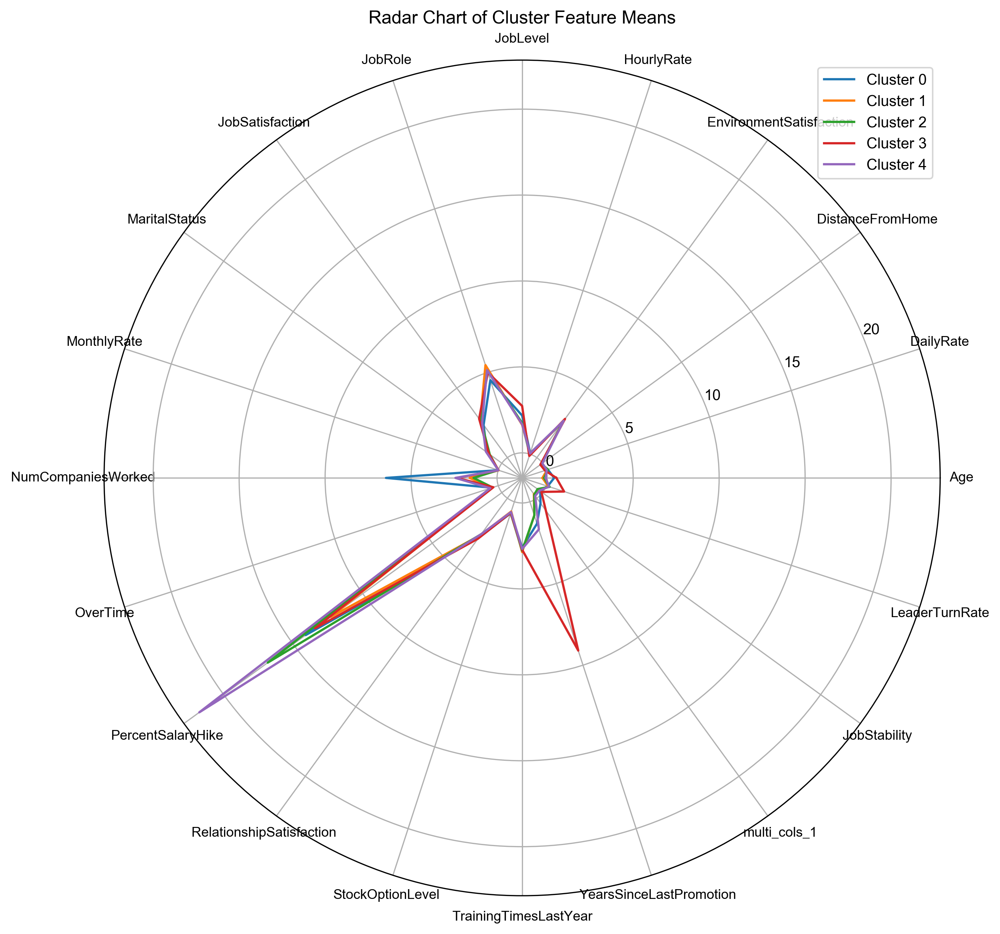

In [55]:
cluster_profiles = df.groupby('Cluster').mean()

# 雷达图绘制
features = cluster_profiles.columns
num_features = len(features)

angles = np.linspace(0, 2 * np.pi, num_features, endpoint=False).tolist()
angles += angles[:1]  # 闭合图形

plt.figure(figsize=(10, 10), dpi=300)
for i in range(cluster_profiles.shape[0]):
    values = cluster_profiles.iloc[i].tolist()
    values += values[:1]
    plt.polar(angles, values, label=f'Cluster {i}')
plt.xticks(angles[:-1], features, fontsize=9)
plt.title("Radar Chart of Cluster Feature Means")
plt.legend()
plt.show()